# 01 - SnakeCLEF - Localize Saliency Regions Example

In [1]:
import os

os.chdir('..')

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch

from src.core import models, metrics, training, data
from src.special import saliency
from src.utils import visualization as viz

DATA_DIR = 'data/snake_clef2021_dataset/'
TRAIN_SET_DIR = 'train'

MODEL_ARCH = 'efficientnet_b0'
MODEL_NAME = 'baselines_mini/clef2021_efficientnet_b0_ce_11-10-2021_11-09-53'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')

Device: cpu


## Load the Data

In [3]:
# train_df = pd.read_csv(DATA_DIR + 'SnakeCLEF2021_train_metadata_mini.csv')
train_df = pd.read_csv(DATA_DIR + 'SnakeCLEF2021_train_metadata_cleaned.csv')

classes = np.unique(train_df['binomial'])
no_classes = len(classes)
print(f'No classes: {no_classes}')
print(f'Train set length: {len(train_df):,d}')

No classes: 770
Train set length: 374,673


In [4]:
uuids = [
    '1a6271f84cd34595bfd0cb0dccbbde33',
    'd2d361525c9144c0aa079b26cea540d6',
    '4a7d5b53dd894853a42cf099a3aa4d7c',
    '632f113577d44ab0bfddae8a975e726a']
cond = train_df['UUID'].isin(uuids)
train_df = pd.concat([
    train_df[cond],
    train_df[~cond].sample(20 - len(uuids))
], axis=0)
len(train_df)

20

## Create NN and Dataset

In [5]:
# create model
model = models.get_model(MODEL_ARCH, no_classes, pretrained=True)
training.load_model(model, MODEL_NAME, path=DATA_DIR + 'models')
assert np.all([param.requires_grad for param in model.parameters()])

model_config = model.pretrained_config

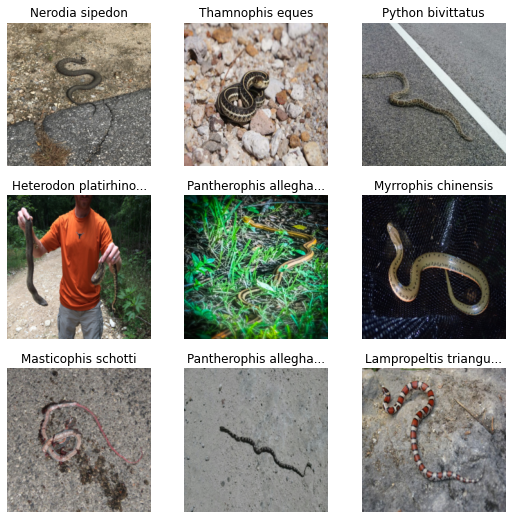

In [6]:
# create transforms
_, tfms = data.get_transforms(
    size=model_config['input_size'], mean=model_config['image_mean'],
    std=model_config['image_std'])

# create dataset
dataset = data.ImageDataset(
    train_df, img_path_col='image_path', label_col='binomial',
    path=DATA_DIR + TRAIN_SET_DIR, transforms=tfms)

dataset.show_items(range(9))

## Create Saliency Map for One Example

In [7]:
# get image
img_idx = 3
img, label = dataset[img_idx]

# create saliency map
saliency_map = saliency.get_saliency_map(model, img, label=label)

# binarize saliency map
saliency_map_bin = saliency.binarize_saliency_map(saliency_map, percentile=95)

# get bounding box covering highest intensities
bbox, saliency_map_cleaned = saliency.get_bounding_box(
    saliency_map, bin_percentile=95, clust_pixel_th=10)

In [13]:
dataset.id2label(label)

'Heterodon platirhinos'

### Plot Saliency Map

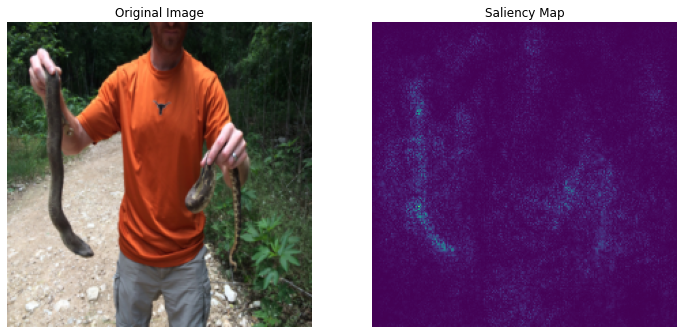

In [8]:
# plot image and saliency map
fig, (ax1, ax2) = viz.create_fig(ncols=2, colsize=6, rowsize=6)
# viz.imshow(img, ax=ax1)
dataset.show_item(img_idx, ax=ax1)
ax1.axis('off')
ax1.set(title='Original Image')
ax2.imshow(saliency_map, cmap='viridis')
ax2.axis('off')
ax2.set(title='Saliency Map')
# fig.tight_layout()
plt.show()

### Plot Binarized Saliency Map

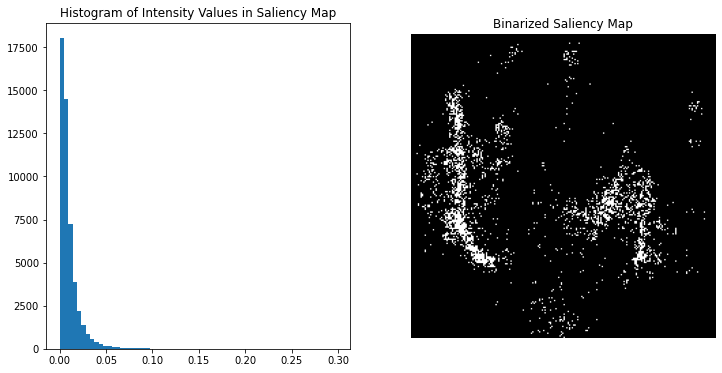

In [9]:
# plot histogram and binarized saliency map
fig, (ax1, ax2) = viz.create_fig(ncols=2, colsize=6, rowsize=6)
ax1.hist(saliency_map.reshape(-1), bins=64)
ax1.set(title='Histogram of Intensity Values in Saliency Map')
ax2.imshow(saliency_map_bin, cmap='gray')
ax2.axis('off')
ax2.set(title='Binarized Saliency Map')
plt.show()

### Plot Cleaned Saliency Map and Found Bounding Box

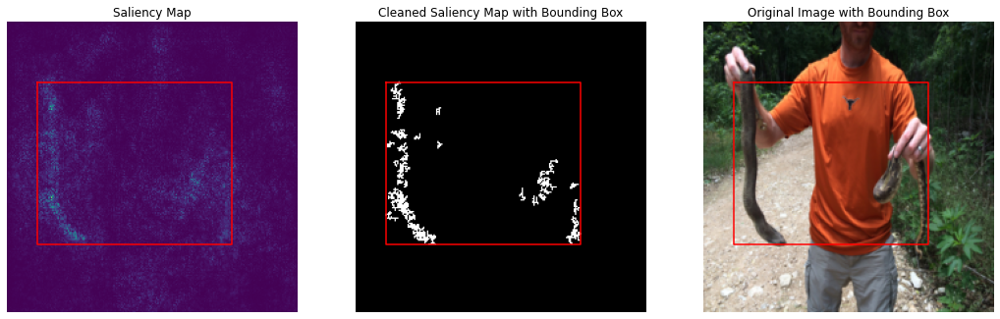

In [10]:
# plot cleaned saliency map with bounding box
fig, (ax1, ax2, ax3) = viz.create_fig(ncols=3, colsize=6, rowsize=6)

viz.imshow(saliency_map, ax=ax1, cmap='viridis', bbox=bbox)
ax1.axis('off')
ax1.set(title='Saliency Map')

viz.imshow(saliency_map_cleaned, ax=ax2, cmap='gray', bbox=bbox)
ax2.axis('off')
ax2.set(title='Cleaned Saliency Map with Bounding Box')

dataset.show_item(img_idx, ax=ax3)
viz.plot_bbox(bbox, ax=ax3)
ax3.axis('off')
ax3.set(title='Original Image with Bounding Box')

plt.show()

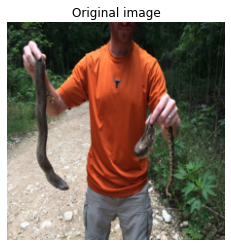

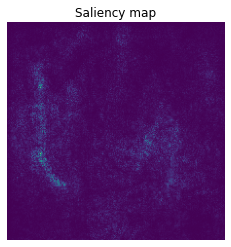

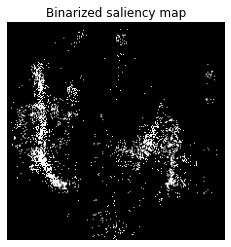

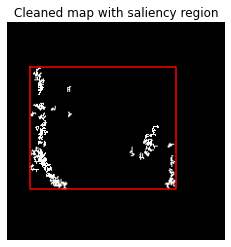

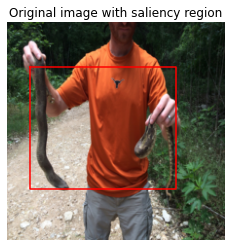

In [12]:
fig, ax = viz.create_fig(colsize=4, rowsize=4)
dataset.show_item(img_idx, ax=ax)
ax.set(title='Original image')
ax.axis('off')
plt.show()
fig.savefig('figures/snake_saliency/original_image.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
viz.imshow(saliency_map, ax=ax, cmap='viridis')
ax.set(title='Saliency map')
ax.axis('off')
plt.show()
fig.savefig('figures/snake_saliency/saliency_map.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
viz.imshow(saliency_map_bin, ax=ax, cmap='gray')
ax.set(title='Binarized saliency map')
ax.axis('off')
plt.show()
fig.savefig('figures/snake_saliency/saliency_map_binarized.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
viz.imshow(saliency_map_cleaned, ax=ax, cmap='gray', bbox=bbox)
ax.set(title='Cleaned map with saliency region')
ax.axis('off')
plt.show()
fig.savefig('figures/snake_saliency/cleaned_map_with_saliency_box.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
dataset.show_item(img_idx, ax=ax)
viz.plot_bbox(bbox, ax=ax)
ax.set(title='Original image with saliency region')
ax.axis('off')
plt.show()
fig.savefig('figures/snake_saliency/original_image_with_saliency_box.png', bbox_inches='tight')

## Create Saliency Map for Multiple Examples

inaturalist/632f113577d44ab0bfddae8a975e726a.jpg


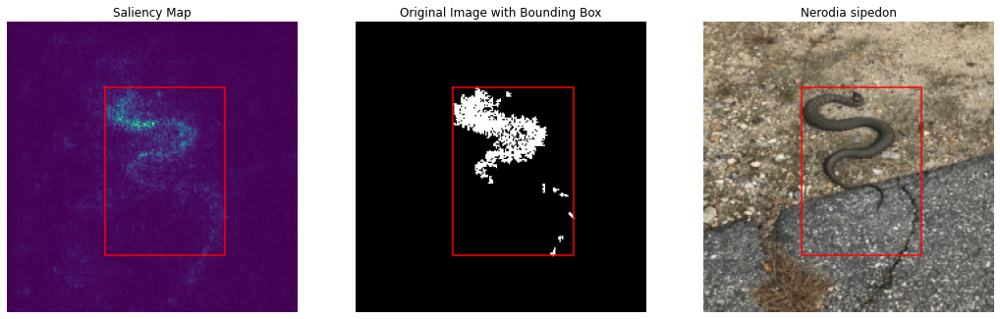

inaturalist/d2d361525c9144c0aa079b26cea540d6.jpg


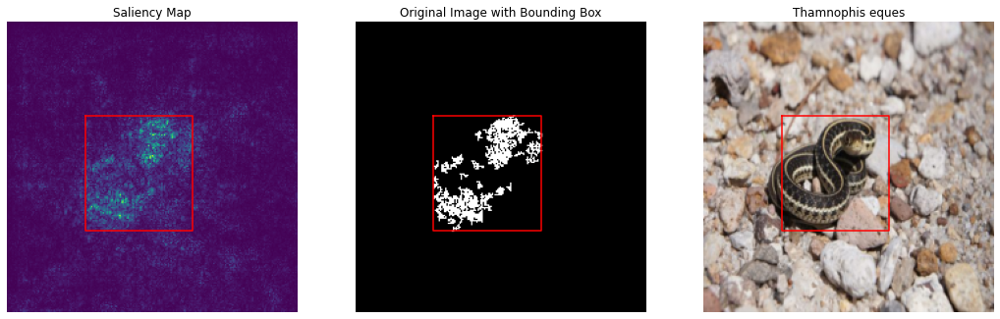

inaturalist/4a7d5b53dd894853a42cf099a3aa4d7c.jpg


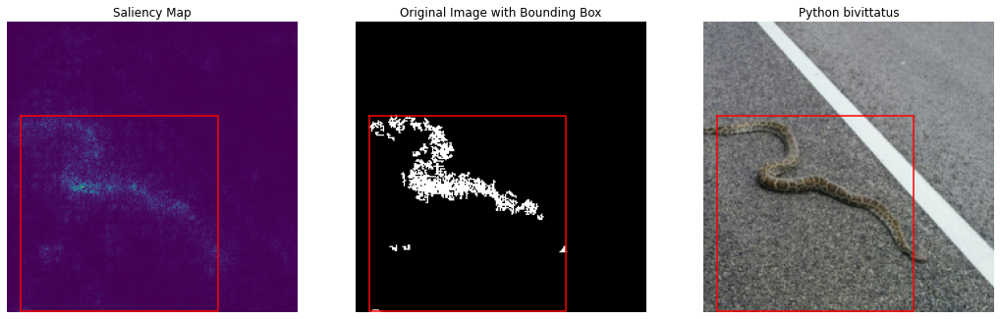

inaturalist/31ce24f80d1a435eb8de2e6a58c8ad50.jpg


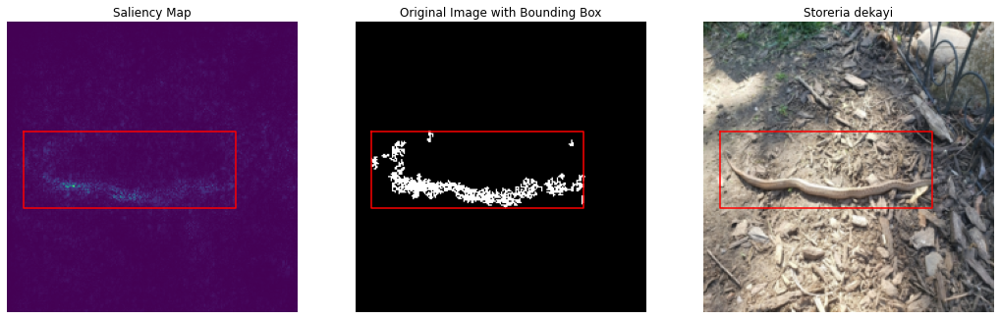

flickr/71678902e0804d95afec1247f7b9aeb5.jpg


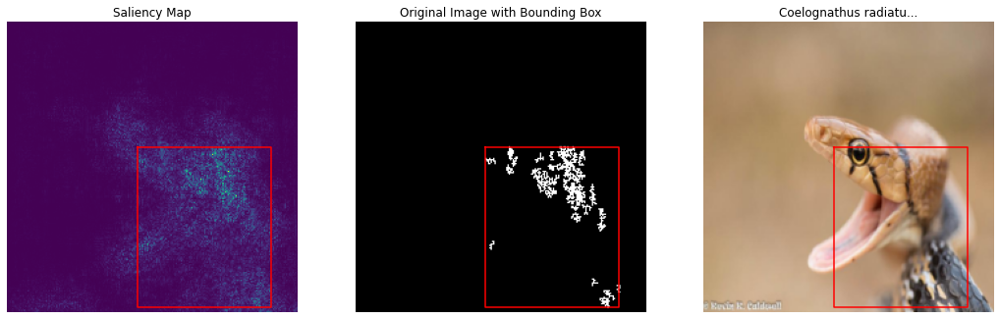

inaturalist/e7b55280255747b3a9464128fb869ec6.jpg


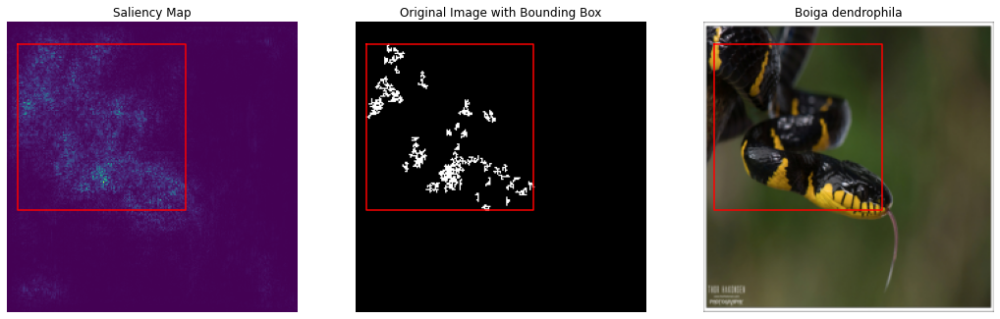

inaturalist/cce593e7980e43a1856021b9c58d78af.jpg


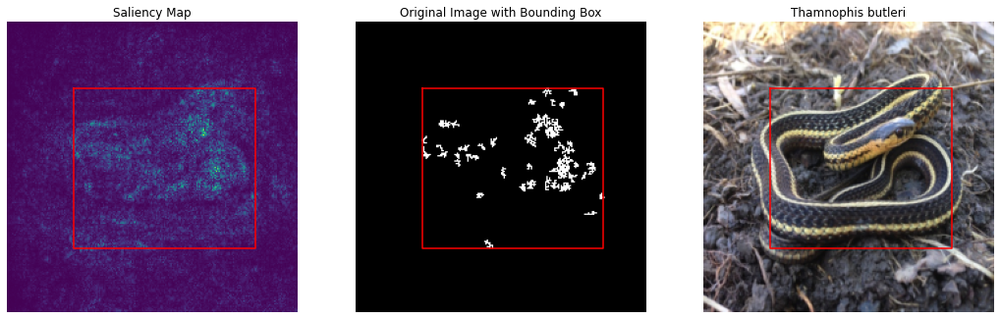

inaturalist/27f853f276ba4befac8a2d89415d1a6a.jpg


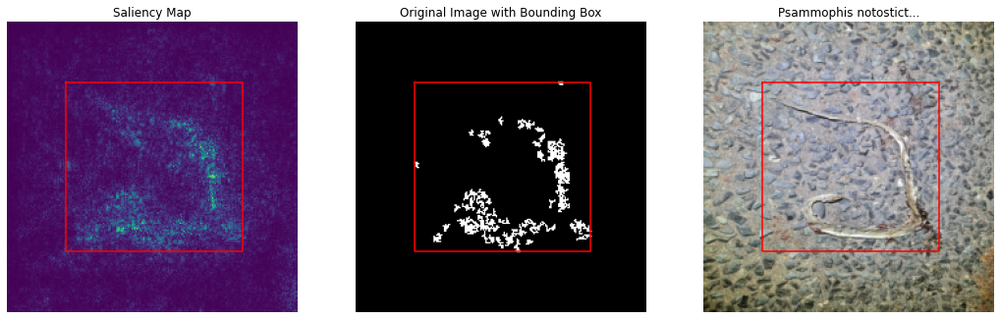

inaturalist/f39f4c3d279042a38e52274b742d9ff6.jpg


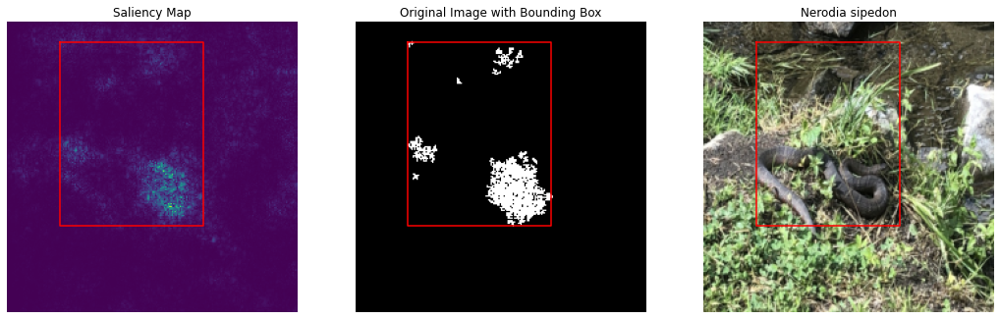

inaturalist/baf30cedac5f43e0bc3679e21d75fc79.jpg


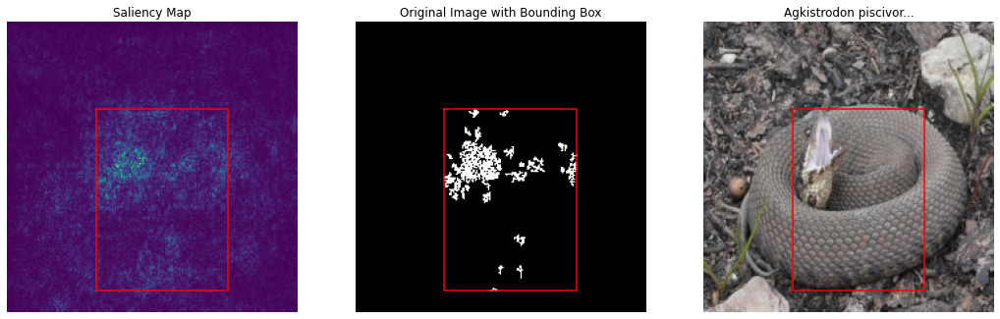

inaturalist/ce8d5743d2f84b938809922977dac431.jpg


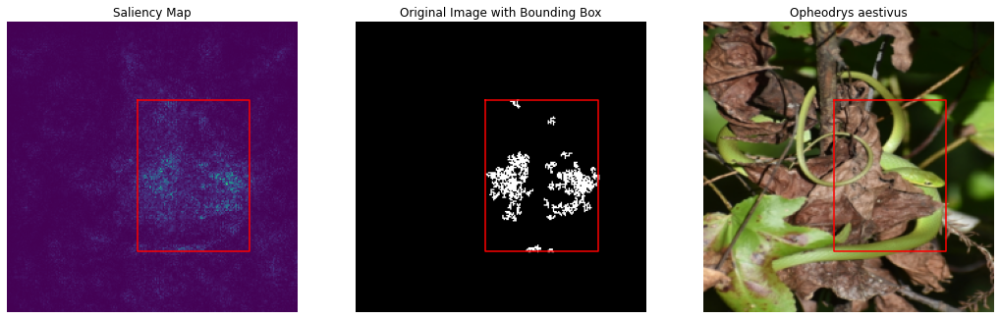

inaturalist/041db6cfa762479d84de2ce4695629db.jpg


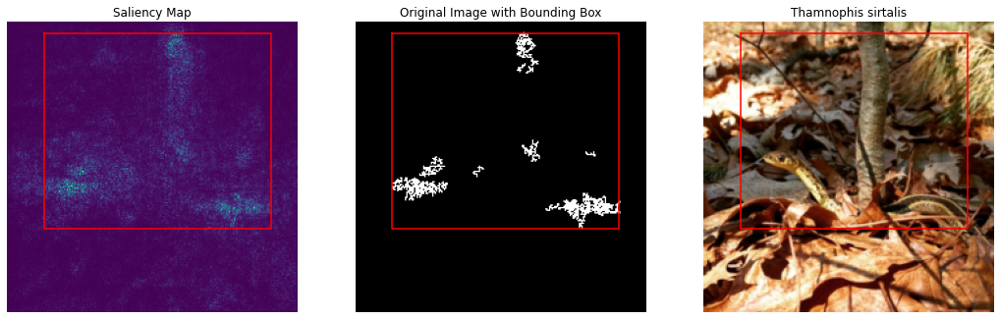

herpmapper/5a3b06f0da844733bcd3893498ed6540.jpg


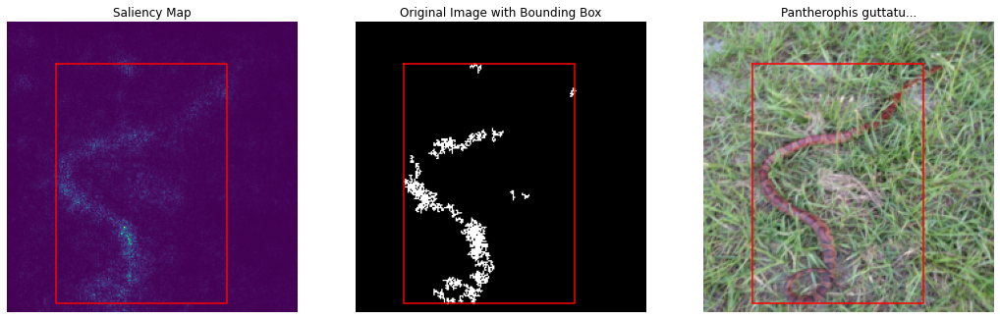

inaturalist/1a226399e3bf4a3188a62c9cd5a8ac82.jpg


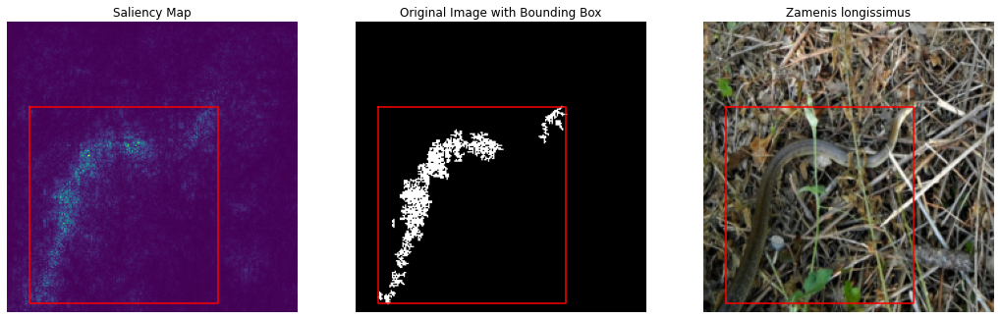

inaturalist/563d74f8300e453bb0745b42d0df9771.jpg


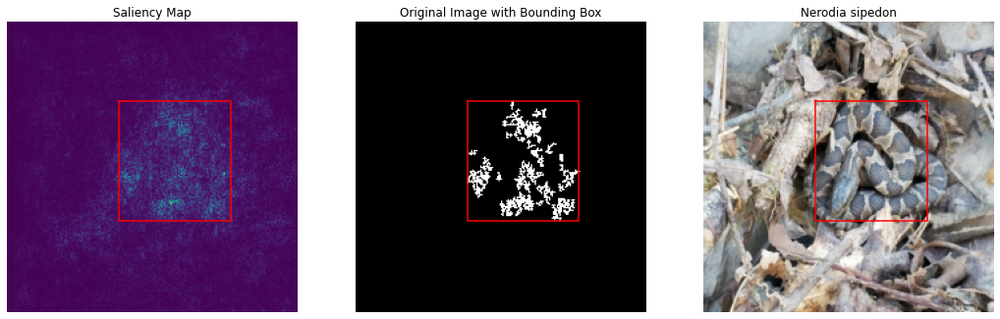

inaturalist/282151a7d05641da9a1e8901d50c6e02.jpg


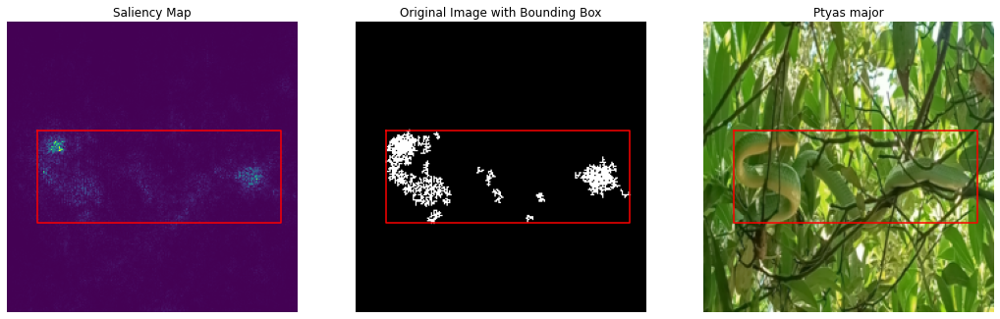

inaturalist/ccbd8833ccbd4271b9122d6f94cda644.jpg


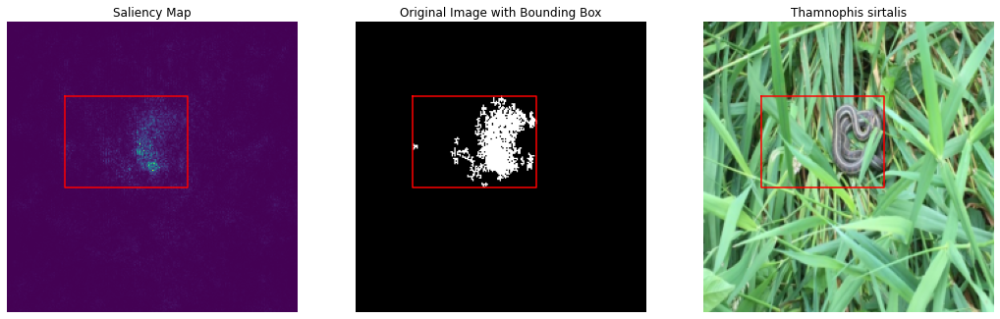

inaturalist/18d3b68ff506425782f93a0702fc993f.jpg


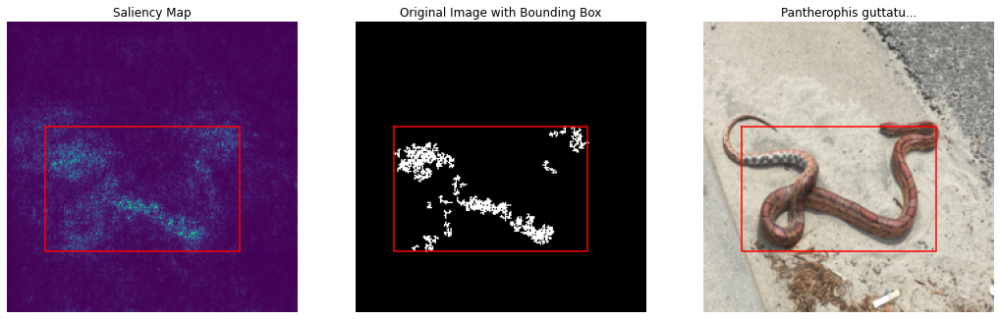

herpmapper/db31cdca59d44ee8b83f99d486f5caa2.jpg


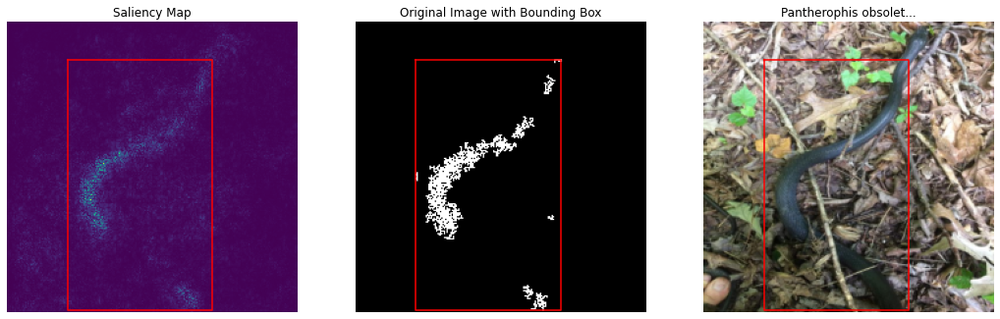

inaturalist/39b3b345bf4e48b39dc0b1f5c839d49d.jpg


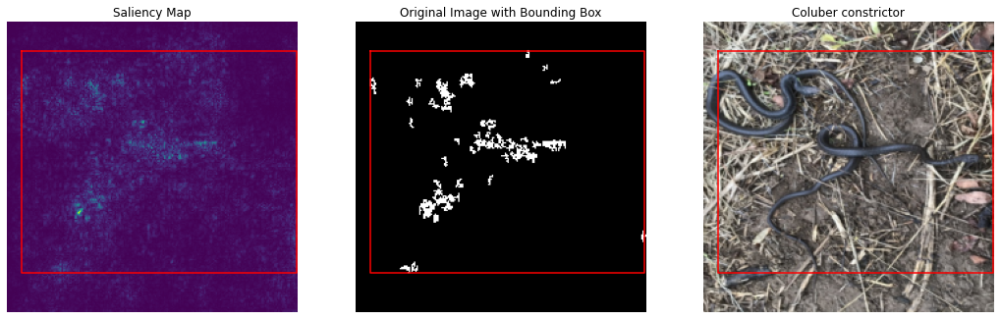

In [13]:
for i in range(20):
    # get image
    img, label = dataset[i]
    print(dataset.df['image_path'].iloc[i])

    # create saliency map
    saliency_map = saliency.get_saliency_map(model, img, label=label)

    # get bounding box covering highest intensities
    bbox, saliency_map_cleaned = saliency.get_bounding_box(
        saliency_map, bin_percentile=95, clust_pixel_th=10)

    # plot results
    fig, (ax1, ax2, ax3) = viz.create_fig(ncols=3, colsize=6, rowsize=6)

    viz.imshow(saliency_map, ax=ax1, cmap='viridis', bbox=bbox)
    ax1.axis('off')
    ax1.set(title='Saliency Map')

    viz.imshow(saliency_map_cleaned, ax=ax2, cmap='gray', bbox=bbox)
    ax2.axis('off')
    ax2.set(title='Cleaned Saliency Map with Bounding Box')

    dataset.show_item(i, ax=ax3)
    viz.plot_bbox(bbox, ax=ax3)
    ax2.axis('off')
    ax2.set(title='Original Image with Bounding Box')

    plt.show()